In [3]:
from typing import Optional, Union, Tuple, List, Callable, Dict
from tqdm.notebook import tqdm
import torch
from diffusers import AutoencoderKL, StableDiffusionPipeline, DDIMScheduler
import torch.nn.functional as nnf
import numpy as np
import shutil
from torch.optim.adam import Adam
from PIL import Image
import json
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchgeometry as tgm
import cv2
import numpy.typing as npt
from jaxtyping import Float
from torch import Tensor
from pathlib import Path
import json
import os
from torch.utils.data import DataLoader
import tyro
from dataclasses import dataclass
import wandb
from skimage.metrics import structural_similarity as ssim
from math import log10, sqrt
import copy
import matplotlib.pyplot as plt


In [2]:
def load_ldm():
    scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
    MY_TOKEN = ''
    ldm_token = "CompVis/stable-diffusion-v1-4"
    ldm_stable = StableDiffusionPipeline.from_pretrained(ldm_token, use_auth_token=MY_TOKEN, scheduler=scheduler)

    return ldm_stable

ldm_stable = load_ldm()

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
/home/jh27kim/miniconda3/envs/diffusion_inv/lib/python3.8/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:115: FutureWarning: The configuration file of this scheduler: DDIMScheduler {
  "_class_name": "DDIMScheduler",
  "_diffusers_version": "0.16.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "sample_max_value": 1.0,
  "set_alpha_to

In [21]:
device = 8
NUM_DDIM_STEPS = 50

In [22]:
class DDIM_inversion:
    def __init__(self, model):
        scheduler = DDIMScheduler(beta_start=0.00085, 
                                  beta_end=0.012, 
                                  beta_schedule="scaled_linear", 
                                  clip_sample=False,
                                  set_alpha_to_one=False)

        self.model = model
        self.tokenizer = self.model.tokenizer
        self.model.scheduler.set_timesteps(NUM_DDIM_STEPS)
        self.prompt = None
        self.context = None
        self.model.vae.to(device)
        
    @property
    def scheduler(self):
        return self.model.scheduler
    
#     @torch.no_grad()
    def latent2image(self, latents, return_type='torch'):
        latents = 1 / 0.18215 * latents.detach()
        image = self.model.vae.decode(latents)['sample']
        if return_type == 'np':
            image = (image / 2 + 0.5).clamp(0, 1)
            image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
            image = (image * 255).astype(np.uint8)
        
        if return_type == 'torch':
            image = (image / 2 + 0.5).clamp(0, 1)
            
        return image

    
    @torch.no_grad()
    def image2latent(self, image):
        with torch.no_grad():
            if type(image) is Image:
                image = np.array(image)
            if type(image) is torch.Tensor and image.shape[-1] == 64:
                latents = image
            else:
                image = (image - 0.5) * 2.0
                if image.dim == 3:
                    image = image.permute(2, 0, 1).unsqueeze(0).to(device)
                
                latents = self.model.vae.encode(image)['latent_dist'].mean
                latents = latents * 0.18215
        return latents
    
    
    def load_checkpoint(self, ckpt_path, load_ckpt=-1):
        state_dict = None
        
        if load_ckpt == -1:
            ckpt_dir = os.listdir(ckpt_path)
            ckpt_dir.sort(key=lambda x: x.split("_")[-1], reverse=True)
            
            if ckpt_dir:
                ckpt_path = os.path.join(ckpt_path, ckpt_dir[-1])

                print(f"Loaded {load_ckpt} epoch checkpoint")
                state_dict = torch.load(ckpt_path)
            else:
                print(f"No checkpoint found in {ckpt_path}")

        else:
            ckpt_path = os.path.join(ckpt_path, f"state_{load_ckpt}.pt")
            
            if os.path.isfile(ckpt_path):            
                print(f"Loaded {load_ckpt} epoch checkpoint")
                state_dict = torch.load(ckpt_path)
            else:
                print(f"No checkpoint found in {ckpt_path}")
            
        return state_dict
            
        
    def save_checkpoint(self, epoch, ckpt_path, optimizer=None):
        save_ckpt_path = os.path.join(ckpt_path, f"state_{epoch}.pt")
        
        torch.save(
            {
                "decoder": self.model.vae.decoder.state_dict(),
                "epoch": epoch,
                "optimizer": optimizer.state_dict(),
            },
            save_ckpt_path,
        )
        
        print(f"Saved current state {epoch} at {ckpt_path}")
    
    
ddim_inversion = DDIM_inversion(ldm_stable)

In [23]:
import torch.nn as nn
import torch.nn.functional as F

class Conv(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=4,
                               out_channels=4,
                               kernel_size=3,
                               stride=1,
                               padding=1)

    def forward(self, x):
        out = self.conv1(x)

        return out
    
class Res(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=4,
                               out_channels=4,
                               kernel_size=3,
                               stride=1,
                               padding=1)

    def forward(self, x):
        out = self.conv1(x)
        out = out + x

        return out

In [24]:
def latent2image(latents, return_type='torch', vae=None):
    latents = 1 / 0.18215 * latents
    image = vae.decode(latents)['sample']
    if return_type == 'np':
        image = (image / 2 + 0.5).clamp(0, 1)
        image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
        image = (image * 255).astype(np.uint8)

    if return_type == 'torch':
        image = (image / 2 + 0.5).clamp(0, 1)

    return image

def torch_to_pil(img):
    if img.dim() == 4:
        img = img.squeeze(0)
        
    img = img.detach().cpu().permute(1, 2, 0).numpy()
    img = (img * 255.0).astype(np.uint8)
    img = Image.fromarray(img)
    
    return img

def mse(original, predicted):
    mse = np.mean((original - predicted) ** 2)
    return mse

def mse_psnr(original, predicted):
    mse_val = mse(original, predicted)
    if(mse_val == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse_val))
    return mse_val, psnr

def cos_sim(A, B):
    return np.dot(A, B)/(np.linalg.norm(A)*np.linalg.norm(B))

def sub_vec(A, B):
    return np.linalg.norm(A - B) / np.linalg.norm(A)

In [25]:
from torchgeometry.core.conversions import deg2rad
from torchgeometry.core.homography_warper import homography_warp

# Code from
# https://kornia.readthedocs.io/en/v0.1.2/_modules/torchgeometry/core/imgwarp.html

def get_rotation_matrix2d(center, angle, scale):
    r"""Calculates an affine matrix of 2D rotation.

    The function calculates the following matrix:

    .. math::
        \begin{bmatrix}
            \alpha & \beta & (1 - \alpha) \cdot \text{x}
            - \beta \cdot \text{y} \\
            -\beta & \alpha & \beta \cdot \text{x}
            + (1 - \alpha) \cdot \text{y}
        \end{bmatrix}

    where

    .. math::
        \alpha = \text{scale} \cdot cos(\text{angle}) \\
        \beta = \text{scale} \cdot sin(\text{angle})

    The transformation maps the rotation center to itself
    If this is not the target, adjust the shift.

    Args:
        center (Tensor): center of the rotation in the source image.
        angle (Tensor): rotation angle in degrees. Positive values mean
            counter-clockwise rotation (the coordinate origin is assumed to
            be the top-left corner).
        scale (Tensor): isotropic scale factor.

    Returns:
        Tensor: the affine matrix of 2D rotation.

    Shape:
        - Input: :math:`(B, 2)`, :math:`(B)` and :math:`(B)`
        - Output: :math:`(B, 2, 3)`

    Example:
        >>> center = torch.zeros(1, 2)
        >>> scale = torch.ones(1)
        >>> angle = 45. * torch.ones(1)
        >>> M = tgm.get_rotation_matrix2d(center, angle, scale)
        tensor([[[ 0.7071,  0.7071,  0.0000],
                 [-0.7071,  0.7071,  0.0000]]])
    """
    if not torch.is_tensor(center):
        raise TypeError("Input center type is not a torch.Tensor. Got {}"
                        .format(type(center)))
    if not torch.is_tensor(angle):
        raise TypeError("Input angle type is not a torch.Tensor. Got {}"
                        .format(type(angle)))
    if not torch.is_tensor(scale):
        raise TypeError("Input scale type is not a torch.Tensor. Got {}"
                        .format(type(scale)))
    if not (len(center.shape) == 2 and center.shape[1] == 2):
        raise ValueError("Input center must be a Bx2 tensor. Got {}"
                         .format(center.shape))
    if not len(angle.shape) == 1:
        raise ValueError("Input angle must be a B tensor. Got {}"
                         .format(angle.shape))
    if not len(scale.shape) == 1:
        raise ValueError("Input scale must be a B tensor. Got {}"
                         .format(scale.shape))
    if not (center.shape[0] == angle.shape[0] == scale.shape[0]):
        raise ValueError("Inputs must have same batch size dimension. Got {}"
                         .format(center.shape, angle.shape, scale.shape))
    # convert angle and apply scale
    angle_rad = deg2rad(angle)
    alpha = torch.cos(angle_rad) * scale
    beta = torch.sin(angle_rad) * scale

    # unpack the center to x, y coordinates
    x, y = center[..., 0], center[..., 1]

    # create output tensor
    batch_size, _ = center.shape
    M = torch.zeros(batch_size, 2, 3, device=center.device, dtype=center.dtype)
    M[..., 0, 0] = alpha
    M[..., 0, 1] = beta
    M[..., 0, 2] = (1. - alpha) * x - beta * y
    M[..., 1, 0] = -beta
    M[..., 1, 1] = alpha
    M[..., 1, 2] = beta * x + (1. - alpha) * y
    return M


def warp_affine(src: torch.Tensor,
                M: torch.Tensor,
                dsize: Tuple[int, int],
                interpolation_mode: Optional[str] = 'bilinear',
                padding_mode: Optional[str] = 'zeros') -> torch.Tensor:
    r"""Applies an affine transformation to a tensor.

    The function warp_affine transforms the source tensor using
    the specified matrix:

    .. math::
        \text{dst}(x, y) = \text{src} \left( M_{11} x + M_{12} y + M_{13} ,
        M_{21} x + M_{22} y + M_{23} \right )

    Args:
        src (torch.Tensor): input tensor of shape :math:`(B, C, H, W)`.
        M (torch.Tensor): affine transformation of shape :math:`(B, 2, 3)`.
        dsize (Tuple[int, int]): size of the output image (height, width).
        mode (Optional[str]): interpolation mode to calculate output values
          'bilinear' | 'nearest'. Default: 'bilinear'.
        padding_mode (Optional[str]): padding mode for outside grid values
          'zeros' | 'border' | 'reflection'. Default: 'zeros'.

    Returns:
        torch.Tensor: the warped tensor.

    Shape:
        - Output: :math:`(B, C, H, W)`

    .. note::
       See a working example `here <https://github.com/arraiyopensource/
       torchgeometry/blob/master/docs/source/warp_affine.ipynb>`__.
    """
    if not torch.is_tensor(src):
        raise TypeError("Input src type is not a torch.Tensor. Got {}"
                        .format(type(src)))
    if not torch.is_tensor(M):
        raise TypeError("Input M type is not a torch.Tensor. Got {}"
                        .format(type(M)))
    if not len(src.shape) == 4:
        raise ValueError("Input src must be a BxCxHxW tensor. Got {}"
                         .format(src.shape))
    if not (len(M.shape) == 3 or M.shape[-2:] == (2, 3)):
        raise ValueError("Input M must be a Bx2x3 tensor. Got {}"
                         .format(src.shape))
        
    # we generate a 3x3 transformation matrix from 2x3 affine
    M_3x3: torch.Tensor = F.pad(M, (0, 0, 0, 1, 0, 0), mode="constant", value=0)
        
    M_3x3[:, 2, 2] += 1.0
    

    # launches the warper
    return transform_warp_impl(src, M_3x3, (src.shape[-2:]), dsize, interpolation_mode, padding_mode)

def transform_warp_impl(src, dst_pix_trans_src_pix, dsize_src, dsize_dst, interpolation_mode, padding_mode):
    """Compute the transform in normalized cooridnates and perform the warping.
    """
    dst_norm_trans_dst_norm = dst_norm_to_dst_norm(dst_pix_trans_src_pix, dsize_src, dsize_dst)
    
    return homography_warp(patch_src=src, 
                           dst_homo_src=torch.inverse(dst_norm_trans_dst_norm), 
                           dsize=dsize_dst, 
                           mode=interpolation_mode, 
                           padding_mode=padding_mode)

def dst_norm_to_dst_norm(dst_pix_trans_src_pix, dsize_src, dsize_dst):
    # source and destination sizes
    src_h, src_w = dsize_src
    dst_h, dst_w = dsize_dst
    
    # the devices and types
    device = dst_pix_trans_src_pix.device
    dtype = dst_pix_trans_src_pix.dtype
    
    # compute the transformation pixel/norm for src/dst
    src_norm_trans_src_pix = normal_transform_pixel(src_h, src_w).to(device).to(dtype)
    src_pix_trans_src_norm = torch.inverse(src_norm_trans_src_pix)
    dst_norm_trans_dst_pix = normal_transform_pixel(dst_h, dst_w).to(device).to(dtype)

    # compute chain transformations
    dst_norm_trans_src_norm = torch.matmul(
            dst_norm_trans_dst_pix, torch.matmul(
            dst_pix_trans_src_pix, src_pix_trans_src_norm))
    
    return dst_norm_trans_src_norm

def normal_transform_pixel(height, width):

    tr_mat = torch.Tensor([[1.0, 0.0, -1.0],
                           [0.0, 1.0, -1.0],
                           [0.0, 0.0, 1.0]])  # 1x3x3

    tr_mat[0, 0] = tr_mat[0, 0] * 2.0 / (width - 1.0)
    tr_mat[1, 1] = tr_mat[1, 1] * 2.0 / (height - 1.0)

    tr_mat = tr_mat.unsqueeze(0)

    return tr_mat

In [43]:
# Decoder finetune
ckpt_path = "/home/jh27kim/warp_latent/ckpt/dec_ep_5.pt"
state_dict = torch.load(ckpt_path)

dec_finetune = copy.deepcopy(ldm_stable.vae)
dec_finetune.to(device)
dec_finetune.decoder.load_state_dict(state_dict["decoder"])

raw_vae = copy.deepcopy(ldm_stable.vae)
raw_vae.to(device)

AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
          (1): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3,

In [14]:
image_path = "/home/jh27kim/warp_latent/dataset/afhq/val/cat/image"
image_path = [os.path.join(image_path, i) for i in os.listdir(image_path)]
print(image_path[0], len(image_path))

/home/jh27kim/warp_latent/dataset/afhq/val/cat/image/pixabay_cat_002201.jpg 500


In [82]:
# Comparison in image space

scale = torch.ones(1)

PSNR_finetune = []
PSNR_raw = []

SSIM_finetune = []
SSIM_raw = []

MSE_finetune = []
MSE_raw = []

with torch.no_grad():
    for i, img_path in enumerate(image_path):
        src_img = Image.open(img_path)
        src_img = (np.array(src_img) / 255.0).astype(np.float32)
        src_img = torch.tensor(src_img).permute(2, 0, 1).unsqueeze(0).to(device)
        
        src_latent = ddim_inversion.image2latent(src_img)
        angle = (torch.rand(1) - 0.5) * 2 # -1 ~ 1
        angle *= 180.0
        
        latent_center = torch.ones(1, 2)
        latent_center[..., 0] = src_latent.shape[3] / 2  # x
        latent_center[..., 1] = src_latent.shape[2] / 2  # y
        
        _, _, latent_h, latent_w = src_latent.shape
        latent_SO2 = get_rotation_matrix2d(latent_center.to(src_img), angle.to(src_img), scale.to(src_img))
        SO2_warp_latent = warp_affine(src_latent, 
                                latent_SO2, 
                                dsize=(latent_h, latent_w), 
                                interpolation_mode="bilinear", 
                                padding_mode="reflection")
        
        res_finetune = latent2image(SO2_warp_latent, return_type="torch", vae=dec_finetune)
        res_raw = latent2image(SO2_warp_latent, return_type="torch", vae=raw_vae)
        
        # Image warp
        img_center = torch.ones(1, 2)
        img_center[..., 0] = src_img.shape[3] / 2  # x
        img_center[..., 1] = src_img.shape[2] / 2  # y
        img_SO2 = get_rotation_matrix2d(img_center.to(src_img), angle.to(src_img), scale.to(src_img)) 
        _, _, img_h, img_w = src_img.shape

        tar_img = warp_affine(src_img, 
                              img_SO2, 
                              dsize=(img_h, img_w), 
                              interpolation_mode="bilinear", 
                              padding_mode="reflection")
        
        res_raw_numpy = np.array(torch_to_pil(res_raw))
        res_finetune_numpy = np.array(torch_to_pil(res_finetune))
        res_target_numpy = np.array(torch_to_pil(tar_img))
        
        mse_raw, psnr_raw = mse_psnr(res_target_numpy, res_raw_numpy)
        mse_finetune, psnr_finetune = mse_psnr(res_target_numpy, res_finetune_numpy)
        
        SSIM_finetune.append(ssim(res_target_numpy, res_finetune_numpy, channel_axis=-1))
        SSIM_raw.append(ssim(res_target_numpy, res_raw_numpy, channel_axis=-1))
        
        PSNR_finetune.append(psnr_finetune)
        PSNR_raw.append(psnr_raw)
    
        MSE_finetune.append(mse_finetune)
        MSE_raw.append(mse_raw)
        
        print(f"{i} / {len(image_path)}")
        
#         if angle > 120:
#             print(angle)
#             break


0 / 500
1 / 500
2 / 500
3 / 500
4 / 500
5 / 500
6 / 500
7 / 500
8 / 500
9 / 500
10 / 500
11 / 500
12 / 500
13 / 500
14 / 500
15 / 500
16 / 500
17 / 500
18 / 500
19 / 500
20 / 500
21 / 500
22 / 500
23 / 500
24 / 500
25 / 500
26 / 500
27 / 500
28 / 500
29 / 500
30 / 500
31 / 500
32 / 500
33 / 500
34 / 500
35 / 500
36 / 500
37 / 500
38 / 500
39 / 500
40 / 500
41 / 500
42 / 500
43 / 500
44 / 500
45 / 500
46 / 500
47 / 500
48 / 500
49 / 500
50 / 500
51 / 500
52 / 500
53 / 500
54 / 500
55 / 500
56 / 500
57 / 500
58 / 500
59 / 500
60 / 500
61 / 500
62 / 500
63 / 500
64 / 500
65 / 500
66 / 500
67 / 500
68 / 500
69 / 500
70 / 500
71 / 500
72 / 500
73 / 500
74 / 500
75 / 500
76 / 500
77 / 500
78 / 500
79 / 500
80 / 500
81 / 500
82 / 500
83 / 500
84 / 500
85 / 500
86 / 500
87 / 500
88 / 500
89 / 500
90 / 500
91 / 500
92 / 500
93 / 500
94 / 500
95 / 500
96 / 500
97 / 500
98 / 500
99 / 500
100 / 500
101 / 500
102 / 500
103 / 500
104 / 500
105 / 500
106 / 500
107 / 500
108 / 500
109 / 500
110 / 500


In [83]:
compute_mean = lambda x: np.mean(np.array(x))
for arr in [MSE_raw, MSE_finetune, PSNR_raw, PSNR_finetune, SSIM_raw, SSIM_finetune]:
    print(compute_mean(arr))

70.8094210840861
62.96248797353109
29.712933270961624
30.3440079539488
0.5347974003257295
0.5816621336889611


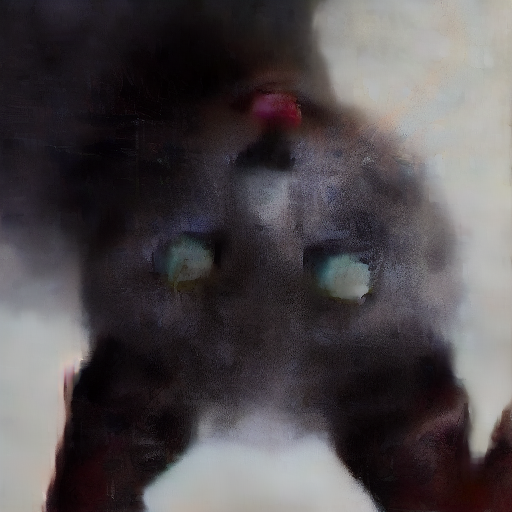

In [78]:
torch_to_pil(res_raw)

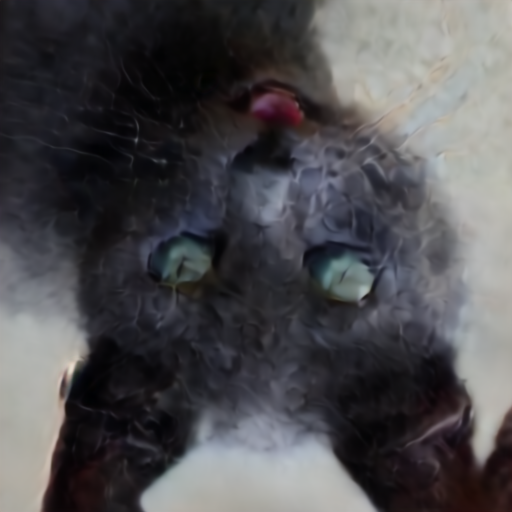

In [79]:
torch_to_pil(res_finetune)

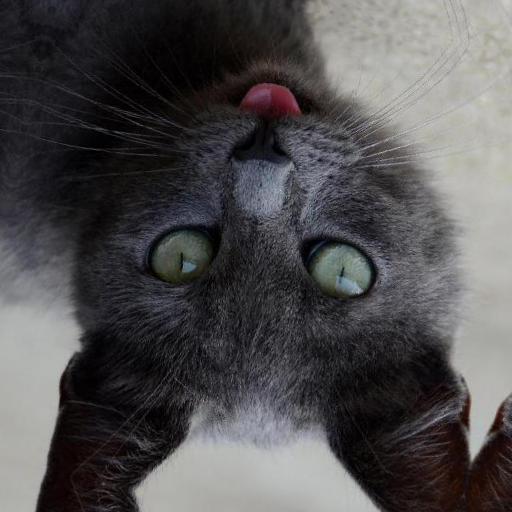

In [80]:
torch_to_pil(tar_img)

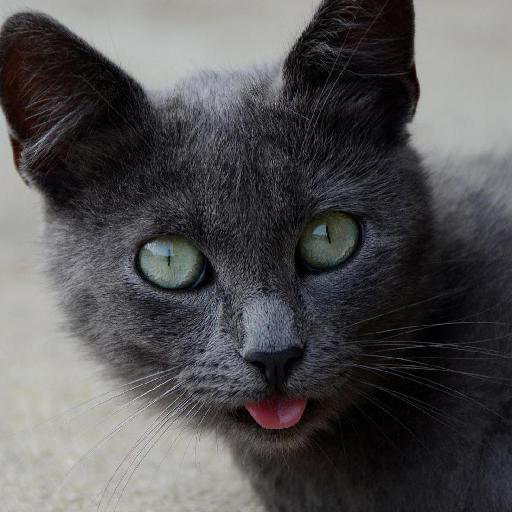

In [81]:
torch_to_pil(src_img)

In [120]:
# Latent finetune - CNN
ckpt_path = "/home/jh27kim/warp_latent/ckpt/latent_cnn_ep_2.pt"
state_dict = torch.load(ckpt_path)
print(state_dict.keys())

finetune_latent_model = Conv()
finetune_latent_model.load_state_dict(state_dict["cnn"])
finetune_latent_model.to(device)

dict_keys(['epoch', 'optimizer', 'cnn'])


Conv(
  (conv1): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [123]:
# Comparison in image space

scale = torch.ones(1)

PSNR_finetune = []
PSNR_raw = []

SSIM_finetune = []
SSIM_raw = []

MSE_finetune = []
MSE_raw = []

with torch.no_grad():
    for i, img_path in enumerate(image_path):
        src_img = Image.open(img_path)
        src_img = (np.array(src_img) / 255.0).astype(np.float32)
        src_img = torch.tensor(src_img).permute(2, 0, 1).unsqueeze(0).to(device)
        
        src_latent = ddim_inversion.image2latent(src_img)
        angle = (torch.rand(1) - 0.5) * 2 # -1 ~ 1
        angle *= 180.0
        
        latent_center = torch.ones(1, 2)
        latent_center[..., 0] = src_latent.shape[3] / 2  # x
        latent_center[..., 1] = src_latent.shape[2] / 2  # y
        
        _, _, latent_h, latent_w = src_latent.shape
        latent_SO2 = get_rotation_matrix2d(latent_center.to(src_img), angle.to(src_img), scale.to(src_img))
        SO2_warp_latent = warp_affine(src_latent, 
                                latent_SO2, 
                                dsize=(latent_h, latent_w), 
                                interpolation_mode="bilinear", 
                                padding_mode="reflection")
        
        SO2_warp_finetune = finetune_latent_model(SO2_warp_latent)
        res_finetune = latent2image(SO2_warp_finetune, return_type="torch", vae=raw_vae)
        res_raw = latent2image(SO2_warp_latent, return_type="torch", vae=raw_vae)
        
        # Image warp
        img_center = torch.ones(1, 2)
        img_center[..., 0] = src_img.shape[3] / 2  # x
        img_center[..., 1] = src_img.shape[2] / 2  # y
        img_SO2 = get_rotation_matrix2d(img_center.to(src_img), angle.to(src_img), scale.to(src_img)) 
        _, _, img_h, img_w = src_img.shape

        tar_img = warp_affine(src_img, 
                              img_SO2, 
                              dsize=(img_h, img_w), 
                              interpolation_mode="bilinear", 
                              padding_mode="reflection")
        
        res_finetune_numpy = np.array(torch_to_pil(res_finetune))
        res_raw_numpy = np.array(torch_to_pil(res_raw))
        res_target_numpy = np.array(torch_to_pil(tar_img))
        
        mse_raw, psnr_raw = mse_psnr(res_target_numpy, res_raw_numpy)
        mse_finetune, psnr_finetune = mse_psnr(res_target_numpy, res_finetune_numpy)
        
        SSIM_finetune.append(ssim(res_target_numpy, res_finetune_numpy, channel_axis=-1))
        SSIM_raw.append(ssim(res_target_numpy, res_raw_numpy, channel_axis=-1))
        
        PSNR_finetune.append(psnr_finetune)
        PSNR_raw.append(psnr_raw)
    
        MSE_finetune.append(mse_finetune)
        MSE_raw.append(mse_raw)
        
        print(f"{i} / {len(image_path)}")
        
        if abs(angle) > 120 and abs(angle) < 130:
            print(angle)
            break


0 / 500
1 / 500
2 / 500
3 / 500
4 / 500
5 / 500
6 / 500
7 / 500
8 / 500
9 / 500
10 / 500
11 / 500
12 / 500
13 / 500
14 / 500
15 / 500
16 / 500
17 / 500
18 / 500
tensor([-123.4194])


In [122]:
compute_mean = lambda x: np.mean(np.array(x))
for arr in [MSE_raw, MSE_finetune, PSNR_raw, PSNR_finetune, SSIM_raw, SSIM_finetune]:
    print(compute_mean(arr))

70.66483674621583
73.029544283549
29.71823754034528
29.558848813796132
0.5343409466584553
0.5361761145710879


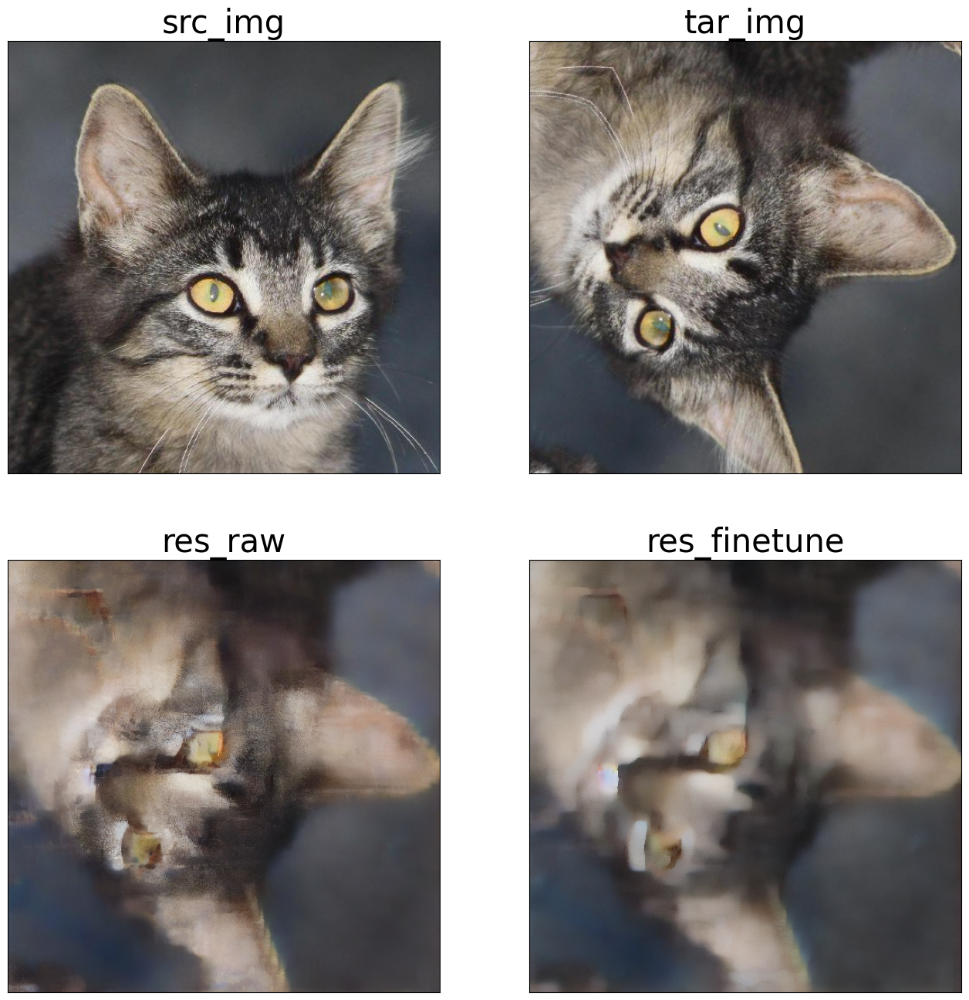

In [124]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
plot_img = [src_img, tar_img, res_raw, res_finetune]
plot_title = ["src_img", "tar_img", "res_raw", "res_finetune"]

for i, ax in enumerate(axs.flatten()):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(plot_title[i], fontsize=30)
    ax.imshow(torch_to_pil(plot_img[i]))

In [126]:
# Latent finetune - ResNet
ckpt_path = "/home/jh27kim/warp_latent/ckpt/latent_resnet_ep_1.pt"
state_dict = torch.load(ckpt_path)
print(state_dict.keys())

finetune_latent_model = Res()
finetune_latent_model.load_state_dict(state_dict["resnet"])
finetune_latent_model.to(device)

dict_keys(['epoch', 'optimizer', 'resnet'])


Res(
  (conv1): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [127]:
# Comparison in image space

scale = torch.ones(1)

PSNR_finetune = []
PSNR_raw = []

SSIM_finetune = []
SSIM_raw = []

MSE_finetune = []
MSE_raw = []

with torch.no_grad():
    for i, img_path in enumerate(image_path):
        src_img = Image.open(img_path)
        src_img = (np.array(src_img) / 255.0).astype(np.float32)
        src_img = torch.tensor(src_img).permute(2, 0, 1).unsqueeze(0).to(device)
        
        src_latent = ddim_inversion.image2latent(src_img)
        angle = (torch.rand(1) - 0.5) * 2 # -1 ~ 1
        angle *= 180.0
        
        latent_center = torch.ones(1, 2)
        latent_center[..., 0] = src_latent.shape[3] / 2  # x
        latent_center[..., 1] = src_latent.shape[2] / 2  # y
        
        _, _, latent_h, latent_w = src_latent.shape
        latent_SO2 = get_rotation_matrix2d(latent_center.to(src_img), angle.to(src_img), scale.to(src_img))
        SO2_warp_latent = warp_affine(src_latent, 
                                latent_SO2, 
                                dsize=(latent_h, latent_w), 
                                interpolation_mode="bilinear", 
                                padding_mode="reflection")
        
        SO2_warp_finetune = finetune_latent_model(SO2_warp_latent)
        res_finetune = latent2image(SO2_warp_finetune, return_type="torch", vae=raw_vae)
        res_raw = latent2image(SO2_warp_latent, return_type="torch", vae=raw_vae)
        
        # Image warp
        img_center = torch.ones(1, 2)
        img_center[..., 0] = src_img.shape[3] / 2  # x
        img_center[..., 1] = src_img.shape[2] / 2  # y
        img_SO2 = get_rotation_matrix2d(img_center.to(src_img), angle.to(src_img), scale.to(src_img)) 
        _, _, img_h, img_w = src_img.shape

        tar_img = warp_affine(src_img, 
                              img_SO2, 
                              dsize=(img_h, img_w), 
                              interpolation_mode="bilinear", 
                              padding_mode="reflection")
        
        res_finetune_numpy = np.array(torch_to_pil(res_finetune))
        res_raw_numpy = np.array(torch_to_pil(res_raw))
        res_target_numpy = np.array(torch_to_pil(tar_img))
        
        mse_raw, psnr_raw = mse_psnr(res_target_numpy, res_raw_numpy)
        mse_finetune, psnr_finetune = mse_psnr(res_target_numpy, res_finetune_numpy)
        
        SSIM_finetune.append(ssim(res_target_numpy, res_finetune_numpy, channel_axis=-1))
        SSIM_raw.append(ssim(res_target_numpy, res_raw_numpy, channel_axis=-1))
        
        PSNR_finetune.append(psnr_finetune)
        PSNR_raw.append(psnr_raw)
    
        MSE_finetune.append(mse_finetune)
        MSE_raw.append(mse_raw)
        
        print(f"{i} / {len(image_path)}")
        
#         if abs(angle) > 120 and abs(angle) < 130:
#             print(angle)
#             break


0 / 500
1 / 500
2 / 500
3 / 500
4 / 500
5 / 500
6 / 500
7 / 500
8 / 500
9 / 500
10 / 500
11 / 500
12 / 500
13 / 500
14 / 500
15 / 500
16 / 500
17 / 500
18 / 500
19 / 500
20 / 500
21 / 500
22 / 500
23 / 500
24 / 500
25 / 500
26 / 500
27 / 500
28 / 500
29 / 500
30 / 500
31 / 500
32 / 500
33 / 500
34 / 500
35 / 500
36 / 500
37 / 500
38 / 500
39 / 500
40 / 500
41 / 500
42 / 500
43 / 500
44 / 500
45 / 500
46 / 500
47 / 500
48 / 500
49 / 500
50 / 500
51 / 500
52 / 500
53 / 500
54 / 500
55 / 500
56 / 500
57 / 500
58 / 500
59 / 500
60 / 500
61 / 500
62 / 500
63 / 500
64 / 500
65 / 500
66 / 500
67 / 500
68 / 500
69 / 500
70 / 500
71 / 500
72 / 500
73 / 500
74 / 500
75 / 500
76 / 500
77 / 500
78 / 500
79 / 500
80 / 500
81 / 500
82 / 500
83 / 500
84 / 500
85 / 500
86 / 500
87 / 500
88 / 500
89 / 500
90 / 500
91 / 500
92 / 500
93 / 500
94 / 500
95 / 500
96 / 500
97 / 500
98 / 500
99 / 500
100 / 500
101 / 500
102 / 500
103 / 500
104 / 500
105 / 500
106 / 500
107 / 500
108 / 500
109 / 500
110 / 500


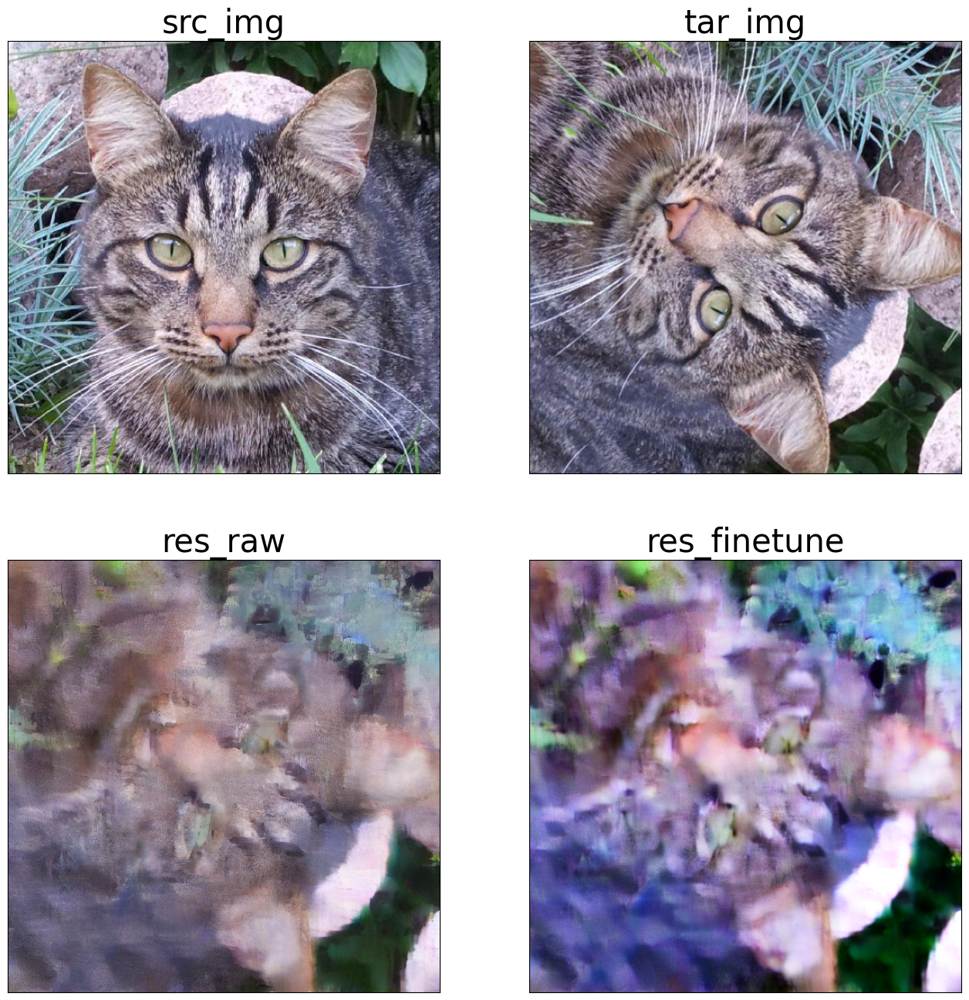

In [116]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
plot_img = [src_img, tar_img, res_raw, res_finetune]
plot_title = ["src_img", "tar_img", "res_raw", "res_finetune"]

for i, ax in enumerate(axs.flatten()):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(plot_title[i], fontsize=30)
    ax.imshow(torch_to_pil(plot_img[i]))

In [128]:
compute_mean = lambda x: np.mean(np.array(x))
for arr in [MSE_raw, MSE_finetune, PSNR_raw, PSNR_finetune, SSIM_raw, SSIM_finetune]:
    print(compute_mean(arr))
    

70.89413253275552
69.98418111165365
29.713120349409728
29.778741554850455
0.5310662895205099
0.5422528271222871


In [26]:
# Decoder + CNN finetune
ckpt_path = "/home/jh27kim/warp_latent/ckpt/dec_latent_cnn_ep_3.pt"
state_dict = torch.load(ckpt_path)

dec_finetune = copy.deepcopy(ldm_stable.vae)
dec_finetune.to(device)
dec_finetune.decoder.load_state_dict(state_dict["decoder"])

raw_vae = copy.deepcopy(ldm_stable.vae)
raw_vae.to(device)

# Latent finetune - CNN
finetune_latent_model = Conv()
finetune_latent_model.load_state_dict(state_dict["cnn"])
finetune_latent_model.to(device)

Conv(
  (conv1): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [27]:
# Comparison in image space

scale = torch.ones(1)

PSNR_finetune = []
PSNR_raw = []

SSIM_finetune = []
SSIM_raw = []

MSE_finetune = []
MSE_raw = []

with torch.no_grad():
    for i, img_path in enumerate(image_path):
        src_img = Image.open(img_path)
        src_img = (np.array(src_img) / 255.0).astype(np.float32)
        src_img = torch.tensor(src_img).permute(2, 0, 1).unsqueeze(0).to(device)
        
        src_latent = ddim_inversion.image2latent(src_img)
        angle = (torch.rand(1) - 0.5) * 2 # -1 ~ 1
        angle *= 180.0
        
        latent_center = torch.ones(1, 2)
        latent_center[..., 0] = src_latent.shape[3] / 2  # x
        latent_center[..., 1] = src_latent.shape[2] / 2  # y
        
        _, _, latent_h, latent_w = src_latent.shape
        latent_SO2 = get_rotation_matrix2d(latent_center.to(src_img), angle.to(src_img), scale.to(src_img))
        SO2_warp_latent = warp_affine(src_latent, 
                                latent_SO2, 
                                dsize=(latent_h, latent_w), 
                                interpolation_mode="bilinear", 
                                padding_mode="reflection")
        
        SO2_warp_finetune = finetune_latent_model(SO2_warp_latent)
        res_finetune = latent2image(SO2_warp_finetune, return_type="torch", vae=dec_finetune)
        res_raw = latent2image(SO2_warp_latent, return_type="torch", vae=raw_vae)
        
        # Image warp
        img_center = torch.ones(1, 2)
        img_center[..., 0] = src_img.shape[3] / 2  # x
        img_center[..., 1] = src_img.shape[2] / 2  # y
        img_SO2 = get_rotation_matrix2d(img_center.to(src_img), angle.to(src_img), scale.to(src_img)) 
        _, _, img_h, img_w = src_img.shape

        tar_img = warp_affine(src_img, 
                              img_SO2, 
                              dsize=(img_h, img_w), 
                              interpolation_mode="bilinear", 
                              padding_mode="reflection")
        
        res_finetune_numpy = np.array(torch_to_pil(res_finetune))
        res_raw_numpy = np.array(torch_to_pil(res_raw))
        res_target_numpy = np.array(torch_to_pil(tar_img))
        
        mse_raw, psnr_raw = mse_psnr(res_target_numpy, res_raw_numpy)
        mse_finetune, psnr_finetune = mse_psnr(res_target_numpy, res_finetune_numpy)
        
        SSIM_finetune.append(ssim(res_target_numpy, res_finetune_numpy, channel_axis=-1))
        SSIM_raw.append(ssim(res_target_numpy, res_raw_numpy, channel_axis=-1))
        
        PSNR_finetune.append(psnr_finetune)
        PSNR_raw.append(psnr_raw)
    
        MSE_finetune.append(mse_finetune)
        MSE_raw.append(mse_raw)
        
        print(f"{i} / {len(image_path)}")
        
#         if abs(angle) > 120 and abs(angle) < 130:
#             print(angle)
#             break


0 / 500
1 / 500
2 / 500
3 / 500
4 / 500
5 / 500
6 / 500
7 / 500
8 / 500
9 / 500
10 / 500
11 / 500
12 / 500
13 / 500
14 / 500
15 / 500
16 / 500
17 / 500
18 / 500
19 / 500
20 / 500
21 / 500
22 / 500
23 / 500
24 / 500
25 / 500
26 / 500
27 / 500
28 / 500
29 / 500
30 / 500
31 / 500
32 / 500
33 / 500
34 / 500
35 / 500
36 / 500
37 / 500
38 / 500
39 / 500
40 / 500
41 / 500
42 / 500
43 / 500
44 / 500
45 / 500
46 / 500
47 / 500
48 / 500
49 / 500
50 / 500
51 / 500
52 / 500
53 / 500
54 / 500
55 / 500
56 / 500
57 / 500
58 / 500
59 / 500
60 / 500
61 / 500
62 / 500
63 / 500
64 / 500
65 / 500
66 / 500
67 / 500
68 / 500
69 / 500
70 / 500
71 / 500
72 / 500
73 / 500
74 / 500
75 / 500
76 / 500
77 / 500
78 / 500
79 / 500
80 / 500
81 / 500
82 / 500
83 / 500
84 / 500
85 / 500
86 / 500
87 / 500
88 / 500
89 / 500
90 / 500
91 / 500
92 / 500
93 / 500
94 / 500
95 / 500
96 / 500
97 / 500
98 / 500
99 / 500
100 / 500
101 / 500
102 / 500
103 / 500
104 / 500
105 / 500
106 / 500
107 / 500
108 / 500
109 / 500
110 / 500


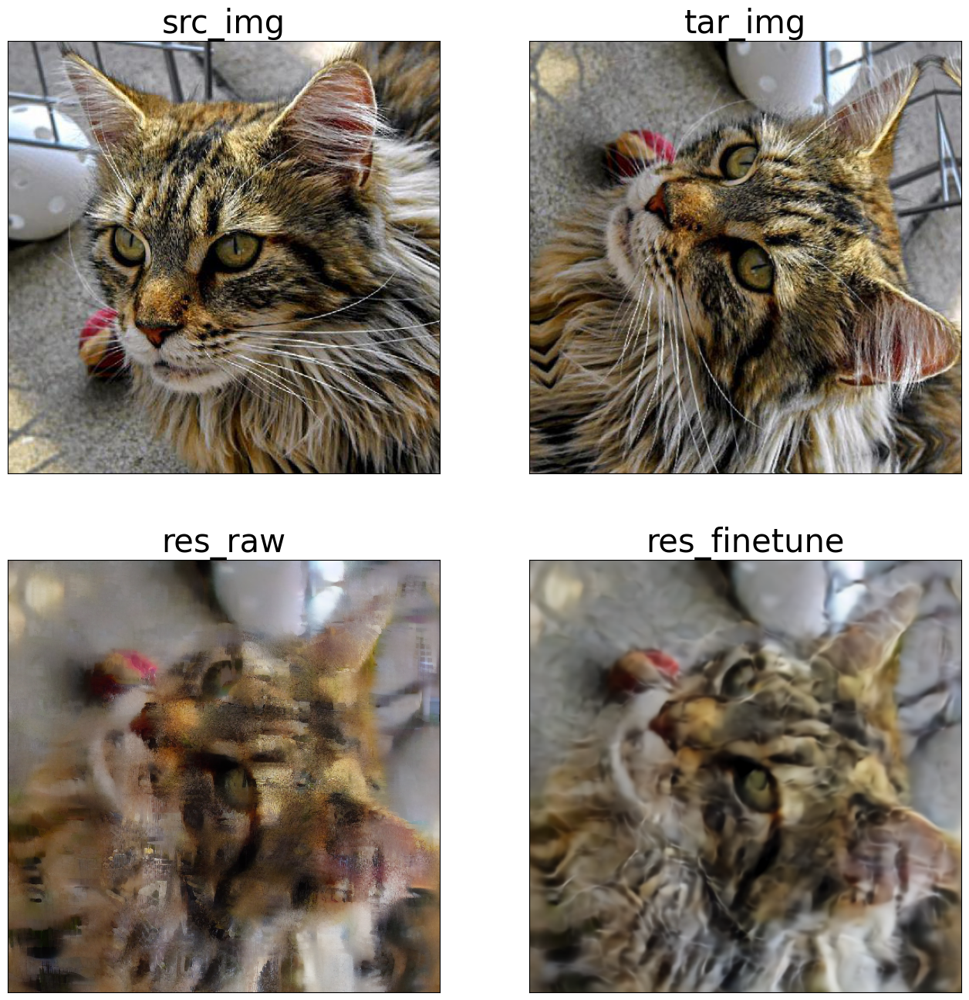

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
plot_img = [src_img, tar_img, res_raw, res_finetune]
plot_title = ["src_img", "tar_img", "res_raw", "res_finetune"]

for i, ax in enumerate(axs.flatten()):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(plot_title[i], fontsize=30)
    ax.imshow(torch_to_pil(plot_img[i]))

In [18]:
compute_mean = lambda x: np.mean(np.array(x))
for arr in [MSE_raw, MSE_finetune, PSNR_raw, PSNR_finetune, SSIM_raw, SSIM_finetune]:
    print(compute_mean(arr))

70.83025737253824
67.60721510314941
29.70419564747094
29.923352513970535
0.5358626643728315
0.5727529973766384
